In [1]:
import rawpy
import numpy as np
from PIL import Image




def preview_and_compare_img(original_img: np.ndarray, applied_styled_img: np.ndarray = None, width: int = 600) -> Image.Image:
    """
    Preview a np.ndarray DNG file, optionally comparing it side-by-side with a styled image.

    Parameters:
        original_img (np.ndarray, optionalr): .
        applied_styled_img (np.ndarray, optional): Styled RGB image to compare. If None, only original_img is shown.
        width (int): Resize width for display (height scaled proportionally).

    Returns:
        PIL.Image.Image: Single image (if no comparison) or side-by-side comparison.
    """
    def process_dng(path):
        with rawpy.imread(path) as raw:
            rgb = raw.postprocess(output_bps=8,                                                                     
                                  use_camera_wb=False,                                
                                #   no_auto_bright=True,                                
                                #   gamma=(1, 1)  # Linear gamma = raw-like rendering            
                                  )
        return rgb

    def resize_np_image(img_np, target_width):
        h, w = img_np.shape[:2]
        scale = target_width / w
        new_size = (target_width, int(h * scale))
        return Image.fromarray(img_np).resize(new_size)

    # Process original_img and resize
    img1_np = original_img
    img1_resized = resize_np_image(img1_np, width)

    # If styled image is not provided, return just the original
    if applied_styled_img is None:
        return img1_resized

    # Resize styled image
    styled_resized = resize_np_image(applied_styled_img, width)

    # Create combined preview
    combined = Image.new("RGB", (img1_resized.width + styled_resized.width, max(img1_resized.height, styled_resized.height)))
    combined.paste(img1_resized, (0, 0))
    combined.paste(styled_resized, (img1_resized.width, 0))

    return combined

In [2]:
import cv2
import numpy as np
from typing import Tuple

def align_images_by_features(img1: np.ndarray, img2: np.ndarray, scale: float = 0.5) -> Tuple[np.ndarray, np.ndarray]:
    """
    Align img2 to img1 using ORB feature detection and homography transformation.

    Parameters:
        img1 (np.ndarray): Reference image (RGB).
        img2 (np.ndarray): Image to be aligned (RGB).
        scale (float): Downscaling factor for faster computation (default 0.5).

    Returns:
        Tuple[np.ndarray, np.ndarray]: (img1, img2_aligned) where img2_aligned matches the perspective of img1.
    """
    h, w = img1.shape[:2]

    # Resize images for faster feature detection
    img1_small = cv2.resize(img1, (int(w * scale), int(h * scale)))
    img2_small = cv2.resize(img2, (int(w * scale), int(h * scale)))

    # Convert to grayscale for feature detection
    gray1 = cv2.cvtColor(img1_small, cv2.COLOR_RGB2GRAY)
    gray2 = cv2.cvtColor(img2_small, cv2.COLOR_RGB2GRAY)

    # ORB feature detector
    orb = cv2.ORB_create(nfeatures=5000)
    kp1, des1 = orb.detectAndCompute(gray1, None)
    kp2, des2 = orb.detectAndCompute(gray2, None)

    # Match features using Brute Force Hamming matcher
    bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
    matches = bf.match(des1, des2)
    matches = sorted(matches, key=lambda x: x.distance)

    # Ensure sufficient matches found
    if len(matches) < 10:
        raise ValueError("Not enough matches found for alignment.")

    # Extract matched keypoints and rescale back
    src_pts = np.float32([kp1[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2) / scale
    dst_pts = np.float32([kp2[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2) / scale

    # Compute homography matrix
    H, mask = cv2.findHomography(dst_pts, src_pts, cv2.RANSAC, 5.0)

    # Warp img2 to align with img1
    img2_aligned = cv2.warpPerspective(img2, H, (w, h))

    return img1, img2_aligned


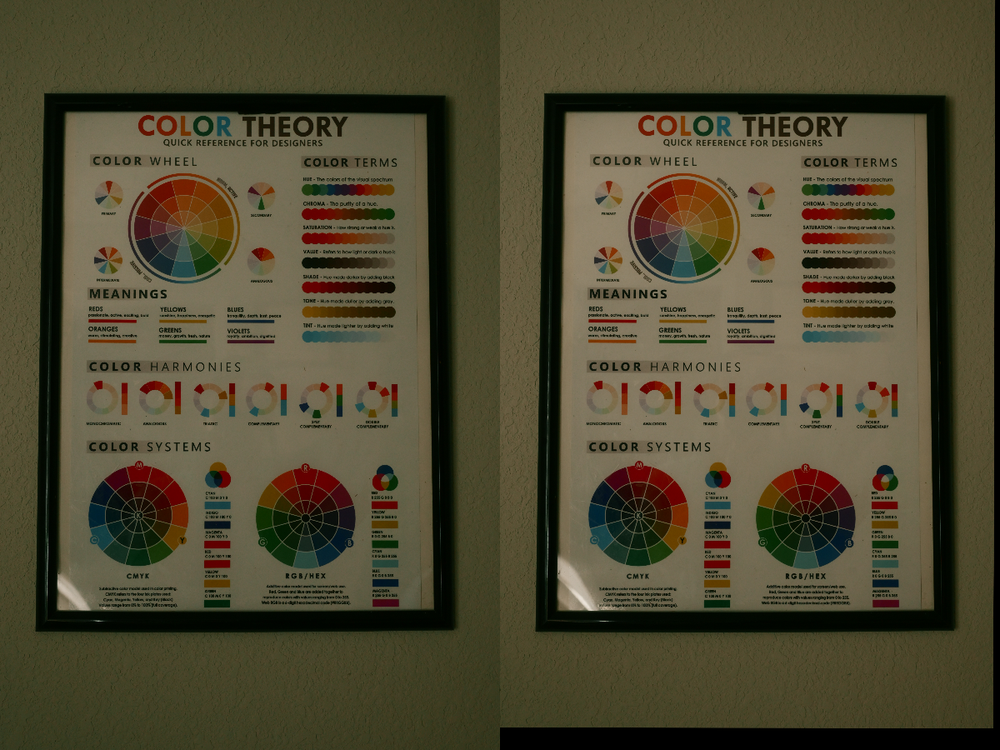

In [3]:
# Load the previously uploaded images
img1_path = "input/DSC_8783.JPG"
img2_path = "input/DSC_8784.JPG"

# Load and convert to RGB
img1 = cv2.cvtColor(cv2.imread(img1_path), cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(cv2.imread(img2_path), cv2.COLOR_BGR2RGB)

# Align image 2 to image 1 using ORB + Homography
img1_aligned, img2_aligned = align_images_by_features(img1, img2)

# Downscale for region analysis
img1_small = cv2.resize(img1_aligned, (600, 900))
img2_small = cv2.resize(img2_aligned, (600, 900))

preview_and_compare_img(img1_small, img2_small).show()
# preview_and_compare_img(img2_small).show()


In [4]:
# Re-import dependencies after reset
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.measure import label, regionprops
from sklearn.cluster import KMeans
import skimage.color
from scipy import ndimage as ndi
from skimage.segmentation import watershed
from skimage.feature import peak_local_max



In [5]:
rgb = (75,73,46)
rgb = (75,73,46)
rgb_np = np.array([[rgb]], dtype=np.uint8)
cv2.cvtColor(rgb_np, cv2.COLOR_RGB2HSV)[0, 0] /2.55

array([10.98039216, 38.82352941, 29.41176471])

In [6]:
def classify_color_from_rgb(rgb) -> tuple[str, str]:
    """
    Classify a given RGB color into a named color category using HSV rules.

    Parameters:
        rgb (array-like): RGB color triplet.

    Returns:
        str: Name of the color (e.g., "red", "green", "gray", etc.)
    """
    # Convert RGB to HSV using OpenCV.
    # Note: OpenCV uses the following ranges:
    #   - Hue (h): 0 to 179  (represents 0° to 360°)
    #   - Saturation (s): 0 to 255
    #   - Value (v): 0 to 255
    rgb_np = np.array([[rgb]], dtype=np.uint8)
    hsv = cv2.cvtColor(rgb_np, cv2.COLOR_RGB2HSV)[0, 0]
    h, s, v = hsv

    tone = None
    color = None

    # Handle achromatic cases first
    if v < 40:
        tone = "shadow"
    elif v > 200:
        tone = "highlight"
    else:
        tone = "mid"

    # Use hue to determine chromatic color
    if h < 10 or h >= 170:
        color = "red"
    elif 10 <= h < 25:
        color =  "orange"
    elif 25 <= h < 35:
        color =  "yellow"
    elif 35 <= h < 85:
        color =  "green"
    elif 85 <= h < 100:
        color =  "cyan"
    elif 100 <= h < 140:
        color =  "blue"
    elif 140 <= h < 160:
        color =  "purple"
    elif 160 <= h < 170:
        color =  "magenta"
    else:
        color =  "other"
    
    return (tone, color)


In [7]:
def detect_color_clusters_from_rgb_image(
    rgb_image: np.ndarray,
    num_clusters: int = 12,
    min_area: int = 200,
    factor_neighbour: float = 0.6,
    factor_downsampling: float = 1.0
) -> list[dict]:
    """
    Perform perceptual color clustering on an RGB image using LAB space and refine using watershed segmentation.

    Parameters:
        rgb_image (np.ndarray): Input image in RGB format.
        num_clusters (int): Number of initial color clusters (via KMeans).
        min_area (int): Minimum area (in pixels) for a detected region to be considered valid.
        factor_neighbour (float): Watershed compactness parameter controlling the greediness of region expansion.
                                  Smaller values (e.g., 0.4–0.6) allow more merging of nearby regions.
        factor_downsampling (float): Scale factor for downsampling (relative to base 512). Range [0.25, 1.0] recommended.

    Returns:
        list of dict: Each dictionary contains:
            - 'label': Original cluster index.
            - 'mask': Boolean mask for the refined region (resized image shape).
            - 'centroid': (row, col) position of the region centroid (in downscaled space).
            - 'avg_color_rgb': Average RGB value for the region.
            - 'color_name': Color label string (e.g., "green", "red").
            - 'tone': Tone label string (e.g., "shadow", "mid", "high").
            - 'area': Pixel area of the region.
    """
    base_size = int(512 * factor_downsampling)
    rgb_small = cv2.resize(rgb_image, (base_size, base_size))

    lab_small = skimage.color.rgb2lab(rgb_small)
    h, w, _ = lab_small.shape
    pixels_lab = lab_small.reshape((-1, 3))

    kmeans = KMeans(n_clusters=num_clusters, random_state=42).fit(pixels_lab)
    labels = kmeans.labels_.reshape((h, w))

    clusters_info = []

    for cluster_id in range(num_clusters):
        binary_mask = (labels == cluster_id).astype(np.uint8)
        distance = ndi.distance_transform_edt(binary_mask)
        coords = peak_local_max(distance, labels=binary_mask, footprint=np.ones((3, 3)))
        local_maxi = np.zeros_like(distance, dtype=bool)
        local_maxi[tuple(coords.T)] = True
        markers = label(local_maxi)

        ws_labels = watershed(-distance, markers, mask=binary_mask, compactness=factor_neighbour)

        for region in regionprops(ws_labels):
            if region.area < min_area:
                continue

            region_mask = (ws_labels == region.label)
            centroid = region.centroid
            avg_rgb_color = np.mean(rgb_small[region_mask], axis=0)
            tone, color_name = classify_color_from_rgb(avg_rgb_color)

            clusters_info.append({
                'label': cluster_id,
                'mask': region_mask,
                'centroid': centroid,
                'avg_color_rgb': avg_rgb_color,
                'color_name': color_name,
                'tone': tone,
                'area': region.area
            })

    return clusters_info


In [8]:
import cv2
import numpy as np

def visualize_color_clusters_on_rgb_image(
    rgb_image: np.ndarray,
    clusters: list,
    scale_background: float = 0.5,
    draw_labels: bool = True
) -> np.ndarray:
    """
    Render visual annotations of detected color clusters on top of the original image.

    Features:
    - Semi-transparent white mask for each cluster
    - Dot (BGR) at centroid to reflect average color
    - Optional text labels (compact)

    Parameters:
        rgb_image (np.ndarray): Original input image.
        clusters (list): Output from detect_color_clusters_from_rgb_image().
        scale_background (float): Scale factor to downsize visualization background. Range [0.1, 1.0].
        draw_labels (bool): If False, skip drawing text labels to improve speed.

    Returns:
        np.ndarray: Annotated overlay image.
    """
    if not (0.1 <= scale_background <= 1.0):
        raise ValueError("scale_background must be in range [0.1, 1.0]")

    new_h, new_w = int(rgb_image.shape[0] * scale_background), int(rgb_image.shape[1] * scale_background)
    vis_rgb = cv2.resize(rgb_image, (new_w, new_h), interpolation=cv2.INTER_LINEAR)
    overlay = vis_rgb.copy()

    for cluster in clusters:
        mask_h, mask_w = cluster['mask'].shape
        scale_y = new_h / mask_h
        scale_x = new_w / mask_w

        y_f, x_f = cluster['centroid']
        px = int(round(x_f * scale_x))
        py = int(round(y_f * scale_y))

        avg_color_rgb = np.clip(cluster['avg_color_rgb'], 0, 255).astype(int)
        avg_color_bgr = tuple(int(c) for c in avg_color_rgb[::-1])

        index = cluster['label']
        color_name_tone = f"{cluster['color_name']}-{cluster['tone']}"
        rgb_text = f"RGB({avg_color_rgb[0]},{avg_color_rgb[1]},{avg_color_rgb[2]})"

        # Resize and apply mask
        mask_small = cluster['mask'].astype(np.uint8) * 255
        mask_resized = cv2.resize(mask_small, (new_w, new_h), interpolation=cv2.INTER_NEAREST)
        mask_binary = (mask_resized > 0).astype(np.uint8)

        try:
            mask_indices = mask_binary == 1
            overlay[mask_indices] = cv2.addWeighted(
                vis_rgb[mask_indices], 0.7, np.full_like(vis_rgb[mask_indices], 255), 0.3, 0
            )
        except Exception as e:
            print(f"Skipping cluster {index} due to blending error: {e}")
            continue

        radius = max(2, int(min(new_h, new_w) * 0.01))
        # cv2.circle(overlay, (px, py), radius, avg_color_bgr, -1)

        

        if draw_labels:
            scale_base = min(new_h, new_w) / 512

            def scaled_text(scale, min_thickness=1):
                font_scale = round(scale_base * scale * 0.5, 2)  # halve the font size
                thickness = max(min_thickness, int(font_scale * 1.5))  # halve thickness
                return font_scale, thickness

            # Track already drawn indices
            if "drawn_indices" not in globals():
                global drawn_indices
                drawn_indices = set()

            font_scale, thickness = scaled_text(0.25)

            if index not in drawn_indices:
                label_text = f"{index} {color_name_tone} {rgb_text}"
                drawn_indices.add(index)
            else:
                label_text = f"{index}"

            # Draw "+" marker at center
            cv2.putText(overlay, "+", (px, py),
                        cv2.FONT_HERSHEY_SIMPLEX, font_scale, (0, 0, 0), thickness)

            # Draw label text next to the dot
            cv2.putText(overlay, label_text, (px + radius + 4, py),
                        cv2.FONT_HERSHEY_SIMPLEX, font_scale, (0, 0, 0), thickness)

    return overlay


In [9]:
clusters = detect_color_clusters_from_rgb_image(img1_aligned, num_clusters=30, min_area=20)
print(len(clusters))
clusters[0]

2764


{'label': 0,
 'mask': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]], shape=(512, 512)),
 'centroid': (np.float64(77.0), np.float64(85.5)),
 'avg_color_rgb': array([91.        , 89.91666667, 67.08333333]),
 'color_name': 'yellow',
 'tone': 'mid',
 'area': np.float64(24.0)}

In [10]:
clusters = detect_color_clusters_from_rgb_image(img1_aligned, num_clusters=30, min_area=20, factor_downsampling=1.5)
print(len(clusters))
clusters[0]


6001


{'label': 0,
 'mask': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]], shape=(768, 768)),
 'centroid': (np.float64(132.2), np.float64(640.6)),
 'avg_color_rgb': array([100.35,  89.35,  62.7 ]),
 'color_name': 'orange',
 'tone': 'mid',
 'area': np.float64(20.0)}

In [11]:
# Re-import required libraries after code execution state reset
import matplotlib.pyplot as plt
import numpy as np
from collections import defaultdict, Counter
from matplotlib.patches import Patch

# Define the function again after reset
def plot_color_tone_distribution(clusters: list) -> None:
    color_order = ["red", "orange", "yellow", "green", "cyan", "blue", "purple", "magenta"]
    tone_order = ["shadow", "mid", "high"]

    tone_counts = defaultdict(lambda: defaultdict(int))
    tone_rgb_sums = defaultdict(lambda: defaultdict(lambda: np.zeros(3)))
    category_totals = Counter()
    tone_totals = defaultdict(int)

    for cluster in clusters:
        color = cluster["color_name"]
        tone = cluster.get("tone", "mid")
        tone_counts[color][tone] += 1
        tone_rgb_sums[color][tone] += cluster["avg_color_rgb"]
        category_totals[color] += 1
        tone_totals[tone] += 1

    total_clusters = sum(category_totals.values())

    fig, ax = plt.subplots(figsize=(14, 7))
    bar_width = 0.25
    x = np.arange(len(color_order))

    for i, tone in enumerate(tone_order):
        bar_vals = [tone_counts[color].get(tone, 0) for color in color_order]
        bars = ax.bar(x + i * bar_width, bar_vals, width=bar_width, label=f"{tone.capitalize()} Tone")

        for j, bar in enumerate(bars):
            color = color_order[j]
            count = tone_counts[color].get(tone, 0)
            if count > 0:
                avg_rgb = tone_rgb_sums[color][tone] / count
                avg_rgb_clipped = np.clip(avg_rgb, 0, 255).astype(int)
                bar.set_color(np.array(avg_rgb_clipped) / 255.0)
                ax.text(
                    bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.5,
                    f"{tone} ({count})\nRGB({avg_rgb_clipped[0]},{avg_rgb_clipped[1]},{avg_rgb_clipped[2]})",
                    ha='center', fontsize=8, rotation=90
                )

    xtick_labels = [f"{color}\n({category_totals[color]})" for color in color_order]
    tone_labels = {"shadow": "Shadow Tone", "mid": "Mid Tone", "high": "High Tone"}
    tone_colors = {"shadow": "#2f0f0f", "mid": "#801515", "high": "#2cb62c"}
    legend_handles = [
        Patch(color=tone_colors[tone], label=f"{tone_labels[tone]} ({tone_totals[tone]})")
        for tone in tone_order
    ]

    ax.set_xlabel("Color Category (Total Clusters)")
    ax.set_ylabel("Number of Clusters")
    ax.set_title(f"Cluster Tone Counts by Color Category (Total = {total_clusters})")
    ax.set_xticks(x + bar_width)
    ax.set_xticklabels(xtick_labels, rotation=0)
    ax.legend(handles=legend_handles, title="Tone Category")
    ax.grid(axis='y')
    plt.tight_layout()
    plt.show()


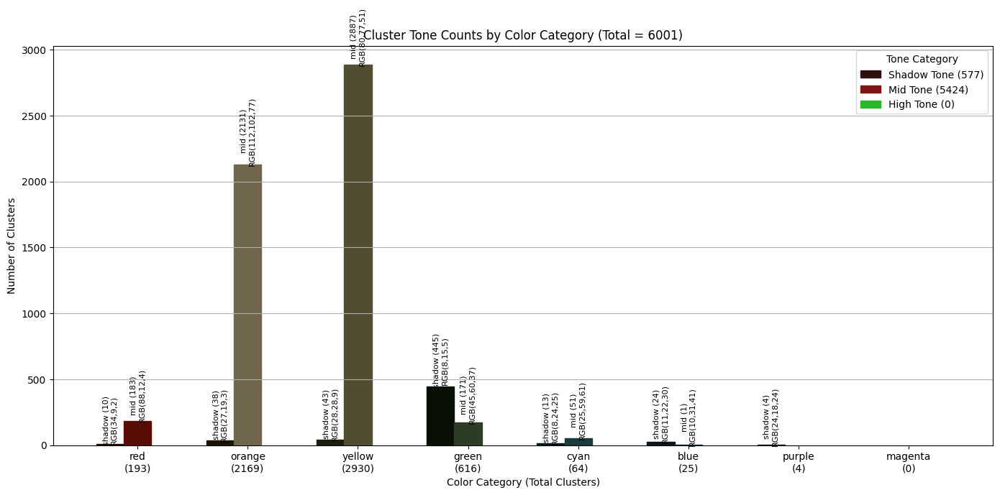

In [12]:
plot_color_tone_distribution(clusters)

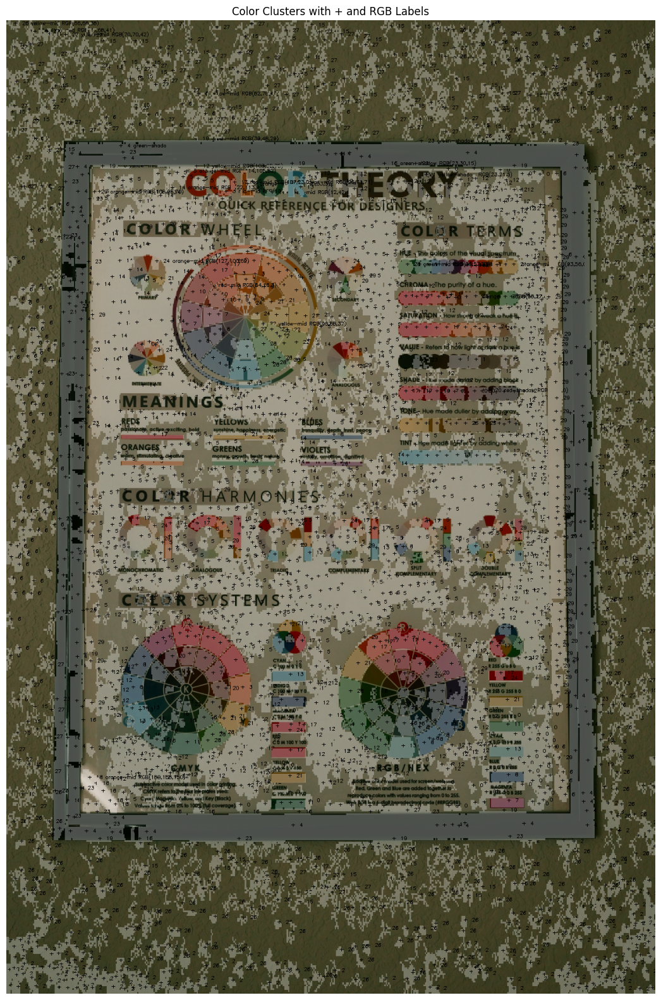

In [13]:
clusters = detect_color_clusters_from_rgb_image(img1_aligned, num_clusters=30, min_area=20)
# cluster_color = [cluster for cluster in clusters if cluster["color_name"] not in ["black", "orange", "yellow", "green"]]
# cluster_color = [cluster for cluster in clusters if cluster["tone"] in ["mid"]]
# cluster_test["mask"] = np.full((256, 256), True, dtype=bool)

vis_overlay = visualize_color_clusters_on_rgb_image(img1_aligned, clusters, scale_background=0.3, draw_labels=True)

plt.figure(figsize=(20, 20))
plt.imshow(vis_overlay)
plt.title("Color Clusters with + and RGB Labels")
plt.axis("off")
plt.show()

In [14]:
clusters[0]

{'label': 0,
 'mask': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]], shape=(512, 512)),
 'centroid': (np.float64(77.0), np.float64(85.5)),
 'avg_color_rgb': array([91.        , 89.91666667, 67.08333333]),
 'color_name': 'yellow',
 'tone': 'mid',
 'area': np.float64(24.0)}

In [15]:
import numpy as np
import cv2
from skimage.transform import resize as sk_resize

def update_cluster_color_info_with_new_image(
    new_rgb_image: np.ndarray,
    clusters: list,
    renamed: bool = True
) -> list:
    """
    Update avg_color_rgb, tone, and color_name of each cluster using a resized version of the new image
    that matches the cluster mask dimensions.

    Parameters:
        new_rgb_image (np.ndarray): New RGB image (H_orig x W_orig x 3).
        clusters (list): List of cluster dictionaries with 'mask' of shape (H_mask x W_mask).
        renamed (bool): If True, updated keys will have *_updated suffix. If False, overwrite original fields.

    Returns:
        list: Updated cluster list.
    """
    if not clusters:
        return []

    mask_shape = clusters[0]['mask'].shape
    target_h, target_w = mask_shape

    # Resize once
    resized_image = cv2.resize(new_rgb_image, (target_w, target_h), interpolation=cv2.INTER_LINEAR)

    updated_clusters = []

    for cluster in clusters:
        mask = cluster['mask']
        region_pixels = resized_image[mask]

        if region_pixels.size == 0:
            avg_rgb = np.array([0, 0, 0])
            tone, color = "unknown", "unknown"
        else:
            avg_rgb = np.mean(region_pixels, axis=0)
            tone, color = classify_color_from_rgb(avg_rgb)

        cluster_updated = cluster.copy()

        if renamed:
            cluster_updated['avg_color_rgb_updated'] = avg_rgb
            cluster_updated['color_name_updated'] = color
            cluster_updated['tone_updated'] = tone
        else:
            cluster_updated['avg_color_rgb'] = avg_rgb
            cluster_updated['color_name'] = color
            cluster_updated['tone'] = tone

        updated_clusters.append(cluster_updated)

    return updated_clusters



In [16]:
bgr_img2_aligned = cv2.cvtColor(img2_aligned, cv2.COLOR_RGB2BGR)
clusters_updated = update_cluster_color_info_with_new_image(bgr_img2_aligned, clusters)
clusters_updated[0]

{'label': 0,
 'mask': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]], shape=(512, 512)),
 'centroid': (np.float64(77.0), np.float64(85.5)),
 'avg_color_rgb': array([91.        , 89.91666667, 67.08333333]),
 'color_name': 'yellow',
 'tone': 'mid',
 'area': np.float64(24.0),
 'avg_color_rgb_updated': array([ 77.125     , 101.125     , 107.08333333]),
 'color_name_updated': 'cyan',
 'tone_updated': 'mid'}

In [17]:
clusters_updated = update_cluster_color_info_with_new_image(bgr_img2_aligned, clusters, renamed=False)
clusters_updated[0]

{'label': 0,
 'mask': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]], shape=(512, 512)),
 'centroid': (np.float64(77.0), np.float64(85.5)),
 'avg_color_rgb': array([ 77.125     , 101.125     , 107.08333333]),
 'color_name': 'cyan',
 'tone': 'mid',
 'area': np.float64(24.0)}

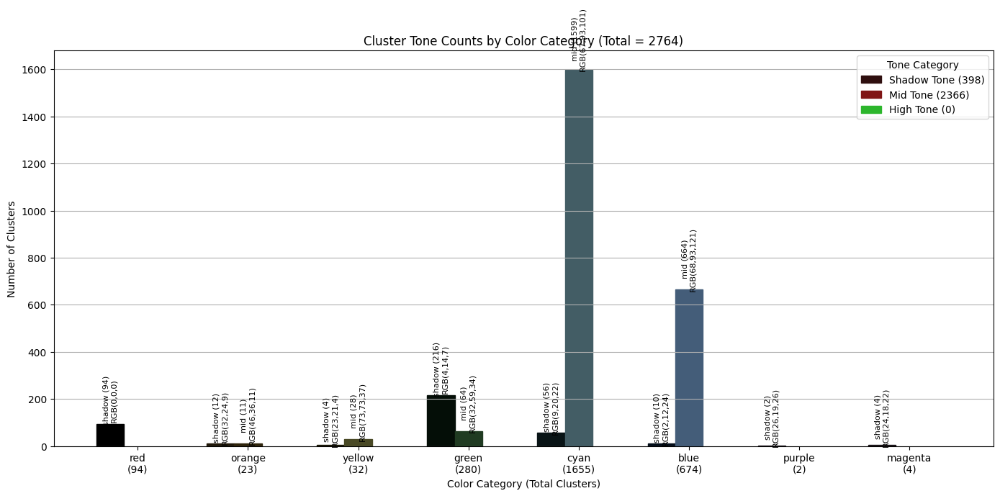

In [18]:
plot_color_tone_distribution(clusters_updated)

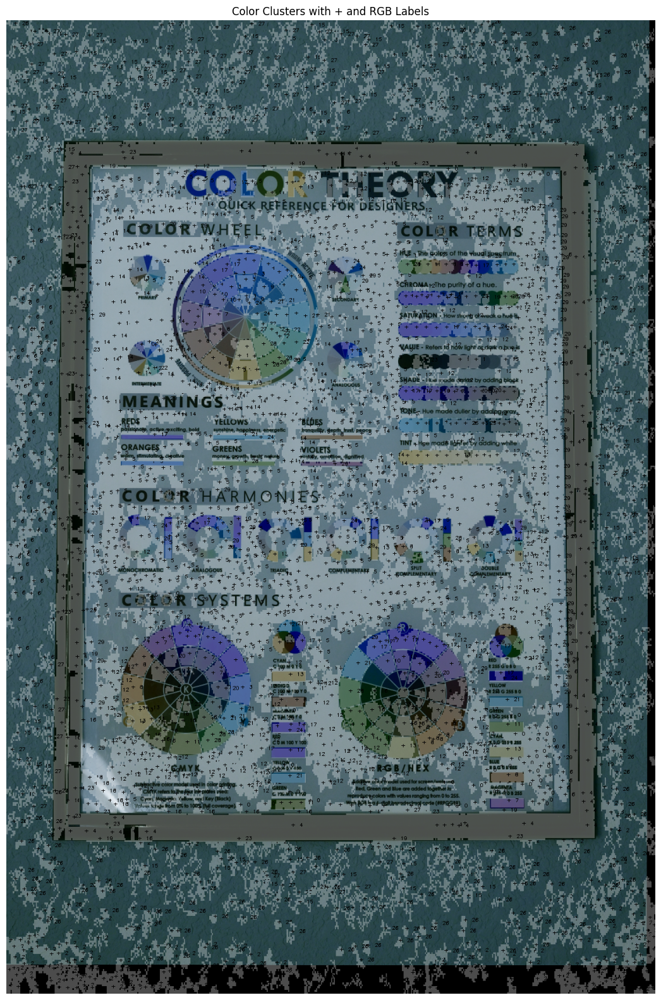

In [19]:
clusters_updated = update_cluster_color_info_with_new_image(bgr_img2_aligned, clusters, renamed=False)
# cluster_color = [cluster for cluster in clusters if cluster["color_name"] not in ["black", "orange", "yellow", "green"]]
# cluster_color = [cluster for cluster in clusters if cluster["tone"] in ["mid"]]
# cluster_test["mask"] = np.full((256, 256), True, dtype=bool)

vis_overlay = visualize_color_clusters_on_rgb_image(bgr_img2_aligned, clusters_updated, scale_background=0.3, draw_labels=True)

plt.figure(figsize=(20, 20))
plt.imshow(vis_overlay)
plt.title("Color Clusters with + and RGB Labels")
plt.axis("off")
plt.show()

In [20]:
color_input = [clu["avg_color_rgb"] for clu in clusters]
color_input

[array([91.        , 89.91666667, 67.08333333]),
 array([90.10344828, 90.79310345, 67.72413793]),
 array([84.73076923, 87.61538462, 65.69230769]),
 array([89.4140625, 88.640625 , 66.53125  ]),
 array([91.        , 89.13333333, 66.53333333]),
 array([89.6 , 87.56, 64.44]),
 array([86.73913043, 87.26086957, 63.65217391]),
 array([88.35, 87.2 , 63.1 ]),
 array([89.9047619 , 89.76190476, 65.66666667]),
 array([90.74193548, 90.25806452, 66.4516129 ]),
 array([89.87878788, 88.09090909, 64.84848485]),
 array([92.49180328, 86.59016393, 64.04918033]),
 array([98.91304348, 87.65217391, 73.91304348]),
 array([84.14705882, 83.73529412, 68.41176471]),
 array([76.05555556, 88.52777778, 77.97222222]),
 array([78.06976744, 89.46511628, 78.58139535]),
 array([85.36585366, 95.07317073, 80.95121951]),
 array([85.95454545, 95.36363636, 80.31818182]),
 array([89.03921569, 96.52941176, 79.31372549]),
 array([95.44827586, 88.4137931 , 67.        ]),
 array([93.19354839, 85.38709677, 64.32258065]),
 array([92

In [21]:
color_output = [clu["avg_color_rgb"] for clu in clusters_updated]
color_output

[array([ 77.125     , 101.125     , 107.08333333]),
 array([ 77.03448276, 102.10344828, 105.48275862]),
 array([75.19230769, 97.65384615, 99.46153846]),
 array([ 74.8046875,  97.8125   , 103.484375 ]),
 array([ 74.5       ,  98.23333333, 104.26666667]),
 array([ 72.16,  96.96, 102.4 ]),
 array([ 72.08695652,  95.82608696, 101.86956522]),
 array([ 71.5 ,  95.85, 101.75]),
 array([ 73.57142857,  98.85714286, 105.14285714]),
 array([ 73.90322581,  98.61290323, 105.74193548]),
 array([ 72.72727273,  97.18181818, 103.36363636]),
 array([ 70.95081967,  94.37704918, 104.98360656]),
 array([ 82.2173913 ,  97.56521739, 110.73913043]),
 array([73.70588235, 90.64705882, 93.85294118]),
 array([86.47222222, 96.80555556, 84.69444444]),
 array([86.90697674, 98.09302326, 87.58139535]),
 array([ 88.73170732, 104.17073171,  96.41463415]),
 array([ 88.81818182, 105.36363636,  97.95454545]),
 array([ 87.54901961, 106.90196078, 103.25490196]),
 array([ 75.48275862,  98.03448276, 110.10344828]),
 array([ 73